<h2> <center> Equations based on ice concentration data</center></h2>

Data: Ice concentration for the years 2006-2017. <br> 

As a demonstration of the proposed approach, the year 2009 was considered. 
Data dimensionality - (365, 125, 125)

For the experiments, each week was averaged, resulting in a tensor of dimension (52, 125, 125).

The derivatives were obtained separately using a fully-connected neural network of the form:
   
       model = torch.nn.Sequential(
                    torch.nn.Linear(dim, 256),
                    torch.nn.Tanh(),
                    torch.nn.Linear(256, 64),
                    torch.nn.Tanh(),
                    torch.nn.Linear(64, 64),
                    torch.nn.Tanh(),
                    torch.nn.Linear(64, 256),
                    torch.nn.Tanh(),
                    torch.nn.Linear(256, 1024),
                    torch.nn.Tanh(),
                    torch.nn.Linear(1024, 1),
                    torch.nn.Sigmoid()
                )


The solution was solved with CUDA, but the size of the gradients did not fit into the graphics card.
Increased the step by t, choosing every third week, i.e. the solutions have the dimension (18, 125, 125).

Solved equations of the form:


        equations = [{'u{power: 1.0} * du/dx1{power: 1.0}': '-1.0',
                      'C_u': 0.05192952246341598,
                      'du/dx1{power: 1.0}': 0.4416866322583885,
                      'u{power: 1.0}': -0.3037816021067234},...]

In [1]:
import pandas as pd
import numpy as np
import torch

from matplotlib import pyplot as plt
import plotly
import plotly.graph_objs as go
import plotly.express as px
from plotly.subplots import make_subplots

import warnings
warnings.filterwarnings("ignore")

In [2]:
# Loading source data (for comparison)
path = "test/"
text, year = 'iceconc', '2009'

list_of_matrices = []

months = {'01': 31, '02': 28, '03': 31, '04': 30, '05': 31, 
          '06': 30, '07': 31, '08': 31, '09': 30, '10': 31,
          '11': 30, '12': 31}

In [3]:
title_config = "Аverage week"

days, counter, flag = 7, 0, False
list_of_matrices_temp = []

for key, value in months.items():

    for day in [f'0{day_i}' if day_i < 10 else f'{day_i}' for day_i in range(1, value + 1)]:        
        data_day = np.load(f'{path}{text}_{year}{key}{day}.npy')
        if counter < days:
            counter += 1
            list_of_matrices_temp.append(data_day)
        else:
            list_of_matrices_temp = np.array(list_of_matrices_temp)
            mean_arr = np.zeros(data_day.shape)
            for i in range(data_day.shape[0]):
                for j in range(data_day.shape[1]):
                    mean_arr[i, j] = np.mean(list_of_matrices_temp[:, i, j])
            mean_arr = mean_arr[np.newaxis, ...]
            
            if not flag:
                list_of_matrices = mean_arr.copy()
                flag = True
            else:
                list_of_matrices = np.concatenate([list_of_matrices, mean_arr])
            
            list_of_matrices_temp, counter = [data_day], 1

In [4]:
data_full = np.array(list_of_matrices)
data = data_full[::3] 

In [5]:
fig = px.imshow(data, animation_frame=0, range_color = [0, 1], labels=dict(animation_frame=title_config))
fig.show()

In [6]:
# Mask of land, where the ice concentration is zero
land_mask = np.load(f'land_mask.npy')
fig = px.imshow(land_mask, text_auto=True)
fig.show()

-----------------

In [7]:
size = data[0].shape

t = np.linspace(0, 1, len(data))
x = np.linspace(0, 1, size[0])
y = np.linspace(0, 1, size[1])

In [8]:
# Loading of the mean solution of the obtained equations
set_solutions = np.load(f'mean_solution_[18, 125, 125].npy')
set_solutions = set_solutions * land_mask

In [9]:
diff = np.abs(set_solutions - data) # Mean Absolute Error
mae = np.mean(diff)
print("MAE:", mae)

MAE: 0.09463332080198214


In [10]:
diff_squared = np.square(set_solutions - data) # Root Mean Squared Error
rmse = np.sqrt(np.mean(diff_squared))
print("RMSE:", rmse)

RMSE: 0.22540806176897418


In [11]:
def mae(prediction, real):
    return round(float(np.mean(abs(np.array(prediction) - np.array(real)))), 3)

In [12]:
start_time = '20090101'
end_time = '20091231'
dates_range = pd.Series(pd.date_range(start=start_time, end=end_time, freq='D'))

In [13]:
years = dates_range.dt.year.unique()
dates = []
for year in years:
    dates_to_predict = pd.date_range(f'{year}0101', f'{year}1231', freq='D')
    dates_to_predict = [d.strftime('%Y%m%d') for d in dates_to_predict]
    dates_to_predict = dates_to_predict[::7]
    dates_to_predict = dates_to_predict[::3]
    dates.extend(dates_to_predict)


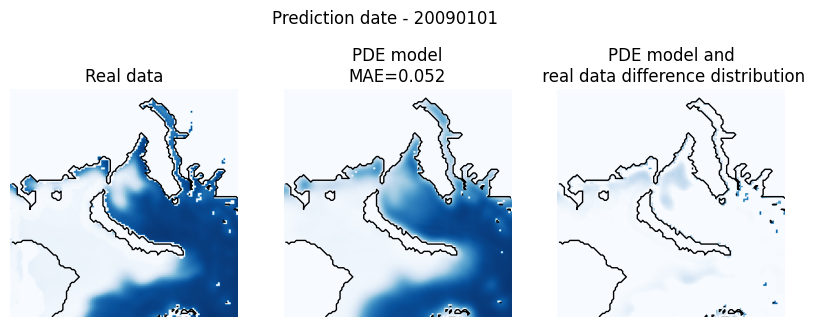

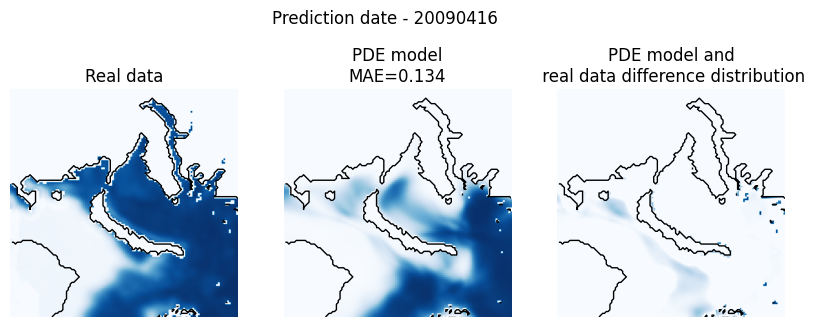

In [14]:
plt.rcParams['image.cmap'] = 'Blues'

for i in [0, 5]:
    plt.rcParams["figure.figsize"] = (10, 4)
    f, axarr = plt.subplots(1, 3)
    axarr[0].imshow(data[i], vmin=0, vmax=1)
    axarr[0].contour(land_mask, [0], origin='lower', colors=['black'], linewidths=[1])
    axarr[0].title.set_text('Real data')
    axarr[1].imshow(set_solutions[i], vmin=0, vmax=1)
    axarr[1].contour(land_mask, [0], origin='lower', colors=['black'], linewidths=[1])
    axarr[1].title.set_text(f'PDE model\nMAE={mae(set_solutions[i], data[i])}')
    axarr[2].imshow(set_solutions[i] - data[i], vmin=0, vmax=1)
    axarr[2].contour(land_mask, [0], origin='lower', colors=['black'], linewidths=[1])
    axarr[2].title.set_text(f'PDE model and\n real data difference distribution')
    
    for j in range(3):
        axarr[j].axis('off')
    f.suptitle(f'Prediction date - {dates[i]}')
    plt.savefig(f'./nemo2_{i}.png', dpi=300)
    plt.show()

In [15]:
fig = px.imshow(set_solutions, animation_frame=0, range_color = [0, 1], labels=dict(animation_frame=title_config))
points = [(55, 115), (70, 55), (55, 70), (45, 50), (100, 80), (90, 105)]

for x_i, y_i in points:
    fig.add_trace(go.Scatter(x=[x_i], y=[y_i], marker=dict(color='red', size=8), showlegend=False))
     
fig.show()

In [16]:
fig = go.Figure()

for x, y in points:
    color = list(np.random.choice(range(256), size=3))
    fig.add_trace(go.Scatter(x=t*(len(data_full) - 1), y=data[:, y, x], 
                             name=f'Point initial - ({x},{y})', 
                             legendgroup=f'point_{x}{y}',
                             line=dict(color='firebrick', width=3)))
    
    
    fig.add_trace(go.Scatter(x=t*(len(data_full) - 1), y=set_solutions[:, y, x], 
                             name=f'Solution field (mean) - ({x},{y})',
                             legendgroup=f'point_{x}{y}',
                             line_color=f'rgb({color[0]},{color[1]},{color[2]})',
                             line=dict(dash='dash')))

fig.update_layout(xaxis_title=title_config,
                  yaxis_title="ice concentration")
        
fig.show()

-----------